In [1]:
from google.colab import drive
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout


In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


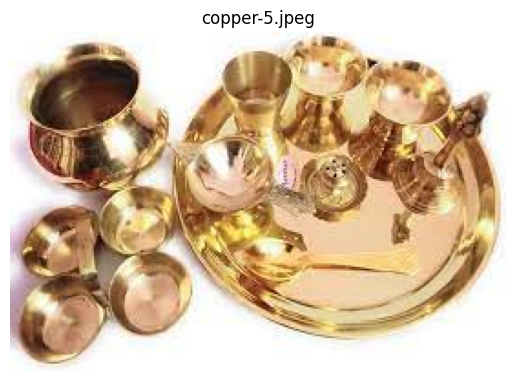

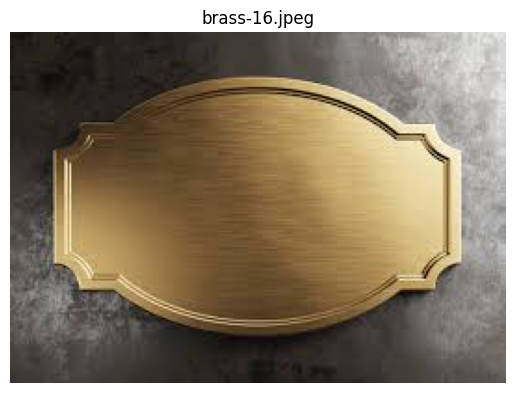

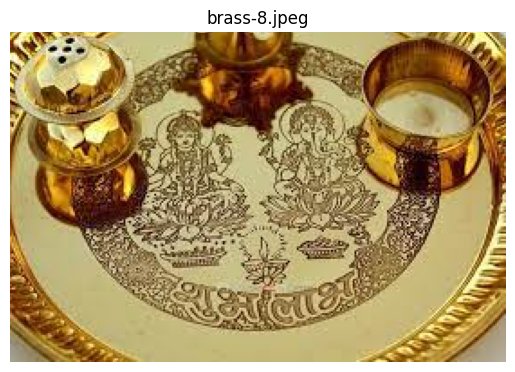

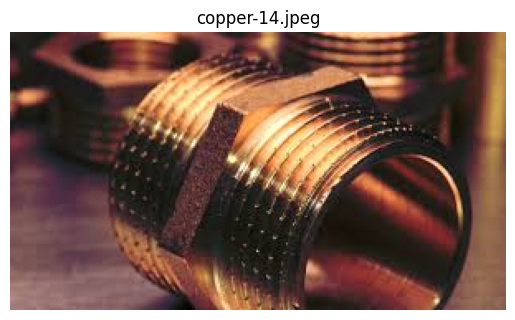

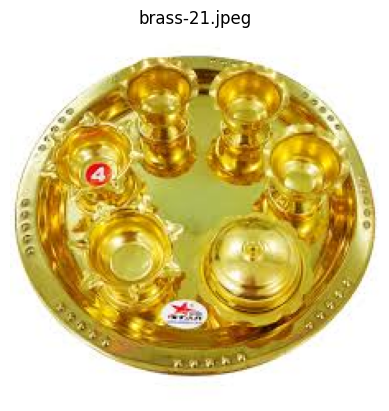

...

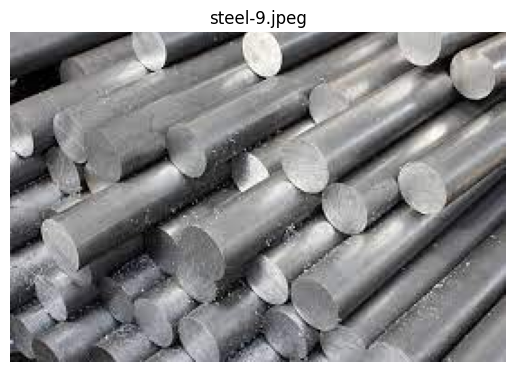

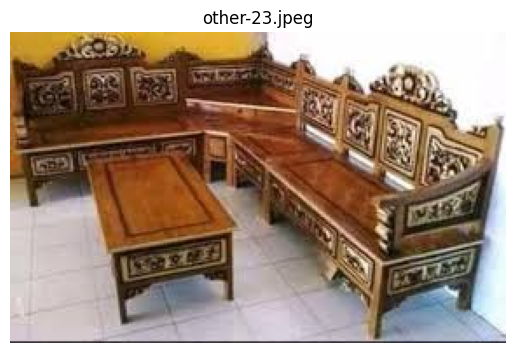

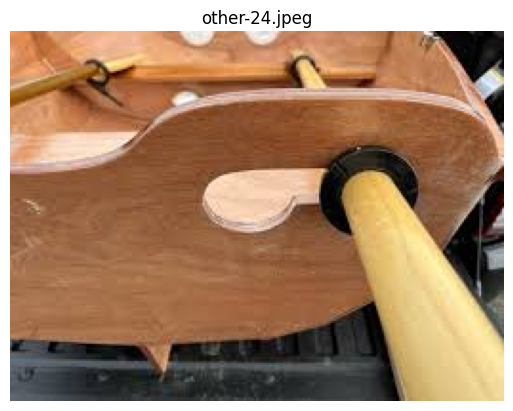

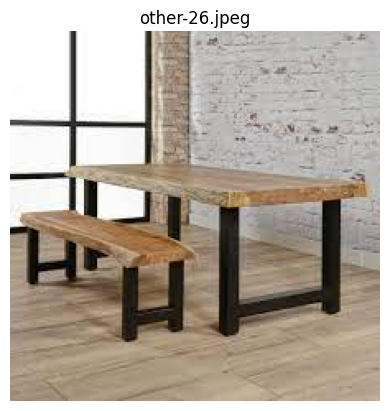

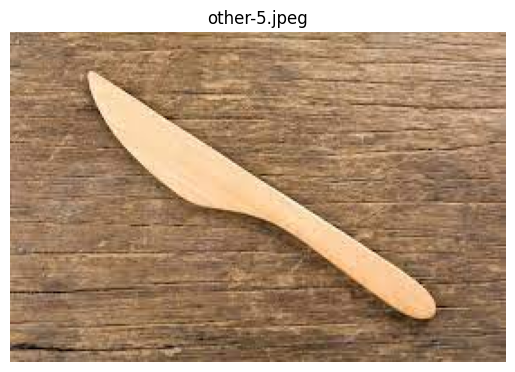

In [3]:

# Path to the directory containing the images
directory = '/content/drive/My Drive/dataset/task_img'

# Function to perform operations on images
def process_images(directory):
    # List all files in the directory
    files = os.listdir(directory)

    # Iterate through each file
    for file in files:
        # Check if the file is an image file
        if file.endswith('.jpg') or file.endswith('.jpeg') or file.endswith('.png'):
            # Construct the full path to the image file
            image_path = os.path.join(directory, file)

            # Read the image
            image = mpimg.imread(image_path)

            # Perform operations on the image (Example: Display the image)
            plt.imshow(image)
            plt.title(file)  # Display the filename as the title
            plt.axis('off')  # Turn off axis
            plt.show()

# Call the function to process images
process_images(directory)


In [4]:

# Function to assign labels based on filename prefix
def get_label(filename):
    if filename.startswith('brass'):
        return 'brass'
    elif filename.startswith('copper'):
        return 'copper'
    elif filename.startswith('steel'):
        return 'steel'
    else:
        return 'other'

# Set up data generator
datagen = ImageDataGenerator(rescale=1./255)

# Function to preprocess image filenames and labels
def preprocess_data(directory):
    filenames = []
    labels = []
    for filename in os.listdir(directory):
        if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
            filenames.append(filename)
            labels.append(get_label(filename))
    return filenames, labels

# Prepare data
filenames, labels = preprocess_data('/content/drive/My Drive/dataset/task_img')

# Split data into training and validation sets
from sklearn.model_selection import train_test_split
train_filenames, val_filenames, train_labels, val_labels = train_test_split(filenames, labels, test_size=0.2, random_state=42)

# Define custom data generator
def custom_generator(filenames, labels, batch_size):
    num_classes = 4  # Number of classes: brass, copper, steel, other
    for i in range(0, len(filenames), batch_size):
        batch_filenames = filenames[i:i+batch_size]
        batch_labels = labels[i:i+batch_size]
        batch_images = []
        batch_encoded_labels = []
        for filename, label in zip(batch_filenames, batch_labels):
            image_path = os.path.join('/content/drive/My Drive/dataset/task_img', filename)
            image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
            image = tf.keras.preprocessing.image.img_to_array(image)
            image = image / 255.0  # Normalize pixel values
            batch_images.append(image)
            # Convert label to one-hot encoded vector
            encoded_label = np.zeros(num_classes)
            if label == 'brass':
                encoded_label[0] = 1
            elif label == 'copper':
                encoded_label[1] = 1
            elif label == 'steel':
                encoded_label[2] = 1
            else:
                encoded_label[3] = 1
            batch_encoded_labels.append(encoded_label)
        yield (tf.convert_to_tensor(batch_images), tf.convert_to_tensor(batch_encoded_labels))




In [5]:

# Define and compile the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # 4 categories: brass, copper, steel, others
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model (using custom_generator)
batch_size = 32
train_steps_per_epoch = len(train_filenames) // batch_size
val_steps_per_epoch = len(val_filenames) // batch_size

train_generator = custom_generator(train_filenames, train_labels, batch_size)
val_generator = custom_generator(val_filenames, val_labels, batch_size)

# Calculate the number of steps per epoch
train_steps_per_epoch = len(train_filenames) // batch_size
if len(train_filenames) % batch_size != 0:
    train_steps_per_epoch += 1  # Include the remaining samples as an additional step

# Similarly, calculate the number of steps for validation
val_steps_per_epoch = len(val_filenames) // batch_size
if len(val_filenames) % batch_size != 0:
    val_steps_per_epoch += 1


history = model.fit(
    train_generator,
    steps_per_epoch=train_steps_per_epoch,
    epochs=10,
    validation_data=val_generator,
    validation_steps=val_steps_per_epoch
)




Epoch 1/10
2/2 [==============================] - 14s 5s/step - loss: 2.3259 - accuracy: 0.3556 - val_loss: 1.8918 - val_accuracy: 0.2500
Epoch 2/10


2/2 [==============================] - 0s 73ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00


In [6]:
try:
    next(val_generator)
except StopIteration:
    print("The val_generator is exhausted.")

The val_generator is exhausted.


In [7]:
# Recreate the validation generator
val_generator = custom_generator(val_filenames, val_labels, batch_size)

# Evaluate the model
evaluation = model.evaluate(val_generator, steps=val_steps_per_epoch)
print("Evaluation Loss:", evaluation[0])
print("Evaluation Accuracy:", evaluation[1])


1/1 [==============================] - 0s 429ms/step - loss: 1.8918 - accuracy: 0.2500
Evaluation Loss: 1.89177668094635
Evaluation Accuracy: 0.25
